In [38]:
pip install tqdm

  Obtaining dependency information for tqdm from https://files.pythonhosted.org/packages/d0/30/dc54f88dd4a2b5dc8a0279bdd7270e735851848b762aeb1c1184ed1f6b14/tqdm-4.67.1-py3-none-any.whl.metadata
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.7/57.7 kB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.5/78.5 kB 6.6 MB/s eta 0:00:00

[notice] A new release of pip is available: 23.2.1 -> 25.2
[notice] To update, run: python -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [20]:
import os               # For file and directory operations
import cv2               # OpenCV for image reading, writing, and processing
import json              # To read/write annotation JSON files
import random            # For shuffling and random selection
import numpy as np       # For numerical operations and alpha blending
from glob import glob    # To find image files
from tqdm import tqdm    # To display progress bars

import albumentations as A  # For simple image augmentations

# Only required if preview=True
import matplotlib.pyplot as plt  # To display images in-memory

In [33]:
# ---------------- SIMPLE AUGMENTATION PIPELINE ---------------- #
simple_augs = A.Compose([
    A.OneOf([
        A.RandomRain(p=0.5, brightness_coefficient=0.9, drop_length=20, blur_value=3),
        A.MotionBlur(blur_limit=7, p=0.5),
        A.RandomFog(fog_coef_lower=0.3, fog_coef_upper=0.6, alpha_coef=0.08, p=0.5),
        A.RandomBrightnessContrast(brightness_limit=(-0.4, 0.4), contrast_limit=(-0.3, 0.3), p=0.5)
    ], p=1.0)
])


# ---------------- COMPOSITE CRACK ALPHA BLEND ---------------- #
def composite_crack_overlay_alpha(base_img, base_ann, donor_img, donor_ann, alpha=0.7):
    with open(donor_ann, "r") as f:
        donor_data = json.load(f)

    if not donor_data.get("objects"):
        return base_img, base_ann

    obj = random.choice(donor_data["objects"])
    (x1, y1), (x2, y2) = obj["points"]["exterior"]

    donor_img_cv = cv2.imread(donor_img)
    crack_patch = donor_img_cv[y1:y2, x1:x2]

    if crack_patch.size == 0:
        return base_img, base_ann

    H, W, _ = base_img.shape
    h, w, _ = crack_patch.shape
    if h >= H or w >= W:
        return base_img, base_ann

    x_offset = random.randint(0, W - w)
    y_offset = random.randint(0, H - h)

    roi = base_img[y_offset:y_offset+h, x_offset:x_offset+w].astype(np.float32)
    crack_patch = crack_patch.astype(np.float32)
    blended_roi = cv2.addWeighted(crack_patch, alpha, roi, 1 - alpha, 0)
    blended_img = base_img.copy()
    blended_img[y_offset:y_offset+h, x_offset:x_offset+w] = blended_roi.astype(np.uint8)

    new_ann = base_ann.copy()
    if "objects" not in new_ann:
        new_ann["objects"] = []

    new_ann["objects"].append({
        "classTitle": obj["classTitle"],
        "points": {"exterior": [[x_offset, y_offset], [x_offset + w, y_offset + h]]},
        "geometryType": "rectangle"
    })

    new_ann["size"] = {"width": W, "height": H}
    return blended_img, new_ann

/tmp/ipykernel_11777/1686121955.py:6: UserWarning: Argument(s) 'fog_coef_lower, fog_coef_upper' are not valid for transform RandomFog
  A.RandomFog(fog_coef_lower=0.3, fog_coef_upper=0.6, alpha_coef=0.08, p=0.5),


In [34]:
# ---------------- SIMPLE AUGMENTATION ---------------- #
def simple_augmentation_update(img, ann_data):
    aug_img = simple_augs(image=img)["image"]
    H, W, _ = aug_img.shape
    new_ann = ann_data.copy()
    new_ann["size"] = {"width": W, "height": H}
    return aug_img, new_ann

In [35]:
# ---------------- SAVE IMAGE WITH DYNAMIC QUALITY ---------------- #
def save_image_dynamic_quality(img, path):
    """
    Save an image with dynamic JPEG quality:
    - If file size > 1MB, use quality=80
    - Else, use quality=90
    """
    _, buf = cv2.imencode('.jpg', img, [int(cv2.IMWRITE_JPEG_QUALITY), 90])
    file_size_kb = len(buf) / 1024
    quality = 80 if file_size_kb > 1024 else 90
    cv2.imwrite(path, img, [int(cv2.IMWRITE_JPEG_QUALITY), quality])

In [36]:
# ---------------- CHECKPOINT ---------------- #
def load_checkpoint(file_path):
    if os.path.exists(file_path):
        with open(file_path, "r") as f:
            processed = set(f.read().splitlines())
    else:
        processed = set()
    return processed

def save_checkpoint(file_path, img_name):
    with open(file_path, "a") as f:
        f.write(img_name + "\n")

# ---------------- FUNCTION TO SHOW PREVIEW ---------------- #
def show_preview(images_list, titles=None):
    n = len(images_list)
    plt.figure(figsize=(3*n,3))
    for i, img in enumerate(images_list):
        plt.subplot(1, n, i+1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        if titles:
            plt.title(titles[i])
    plt.show()

In [37]:
# ---------------- FULL BATCH AUGMENTATION ---------------- #
def batch_augment_pipeline(train_img_dir, train_ann_dir, save_dir,
                           num_simple=7500, num_composite=7500,
                           checkpoint_file="processed_images.txt",
                           alpha=0.7,
                           preview_interval=1000,
                           preview_count=10):

    os.makedirs(os.path.join(save_dir, "images"), exist_ok=True)
    os.makedirs(os.path.join(save_dir, "annotations"), exist_ok=True)

    images = glob(os.path.join(train_img_dir, "*.jpg"))
    random.shuffle(images)

    simple_imgs = images[:num_simple]
    composite_imgs = images[num_simple:num_simple+num_composite]

    processed = load_checkpoint(checkpoint_file)

    # -------- SIMPLE AUGMENTATIONS -------- #
    print(f"Applying simple augmentations to {len(simple_imgs)} images...")
    simple_batch_preview = []
    for idx, img_path in enumerate(tqdm(simple_imgs)):
        img_name = os.path.basename(img_path)
        unique_id = f"simple_{img_name}"
        if unique_id in processed:
            continue

        # Use .jpg.json annotation
        ann_path = os.path.join(train_ann_dir, img_name + ".json")
        if not os.path.exists(ann_path):
            print(f"Annotation not found: {ann_path}")
            continue

        img = cv2.imread(img_path)
        if img is None:
            print(f"Failed to read image: {img_path}")
            continue

        with open(ann_path, "r") as f:
            ann_data = json.load(f)

        aug_img, new_ann = simple_augmentation_update(img, ann_data)

        base_name = os.path.splitext(img_name)[0]
        save_img_path = os.path.join(save_dir, "images", f"{base_name}_aug_simple_{idx}.jpg")
        save_ann_path = os.path.join(save_dir, "annotations", f"{base_name}_aug_simple_{idx}.jpg.json")

        save_image_dynamic_quality(aug_img, save_img_path)
        with open(save_ann_path, "w") as f:
            json.dump(new_ann, f, indent=4)

        simple_batch_preview.append(aug_img)
        if len(simple_batch_preview) >= preview_count and (idx+1) % preview_interval == 0:
            show_preview(simple_batch_preview[:preview_count],
                         titles=[f"Simple {i}" for i in range(preview_count)])
            simple_batch_preview = []

        save_checkpoint(checkpoint_file, unique_id)

    # -------- COMPOSITE AUGMENTATIONS -------- #
    print(f"Applying composite crack overlays to {len(composite_imgs)} images...")
    donor_pool = images.copy()
    random.shuffle(donor_pool)
    donor_idx = 0
    composite_batch_preview = []

    for idx, img_path in enumerate(tqdm(composite_imgs)):
        img_name = os.path.basename(img_path)
        unique_id = f"composite_{img_name}"
        if unique_id in processed:
            continue

        # Use .jpg.json annotation
        ann_path = os.path.join(train_ann_dir, img_name + ".json")
        if not os.path.exists(ann_path):
            print(f"Annotation not found: {ann_path}")
            continue

        img = cv2.imread(img_path)
        if img is None:
            print(f"Failed to read image: {img_path}")
            continue

        with open(ann_path, "r") as f:
            ann_data = json.load(f)

        donor_path = donor_pool[donor_idx]
        donor_ann = os.path.join(train_ann_dir, os.path.basename(donor_path) + ".json")
        donor_idx += 1
        if donor_idx >= len(donor_pool):
            donor_idx = 0
            random.shuffle(donor_pool)

        comp_img, comp_ann = composite_crack_overlay_alpha(img, ann_data, donor_path, donor_ann, alpha=alpha)

        base_name = os.path.splitext(img_name)[0]
        save_img_path = os.path.join(save_dir, "images", f"{base_name}_aug_composite_{idx}.jpg")
        save_ann_path = os.path.join(save_dir, "annotations", f"{base_name}_aug_composite_{idx}.jpg.json")

        save_image_dynamic_quality(comp_img, save_img_path)
        with open(save_ann_path, "w") as f:
            json.dump(comp_ann, f, indent=4)

        composite_batch_preview.append(comp_img)
        if len(composite_batch_preview) >= preview_count and (idx+1) % preview_interval == 0:
            show_preview(composite_batch_preview[:preview_count],
                         titles=[f"Composite {i}" for i in range(preview_count)])
            composite_batch_preview = []

        save_checkpoint(checkpoint_file, unique_id)

    print("✅ Batch augmentation completed with previews and saving!")

Applying simple augmentations to 7500 images...


 13% 997/7500 [02:57<28:15,  3.84it/s]  

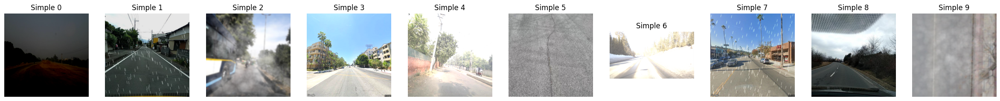

 27% 1999/7500 [05:15<22:30,  4.07it/s]  

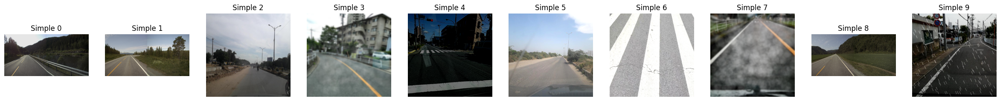

 40% 2998/7500 [07:46<08:32,  8.78it/s]

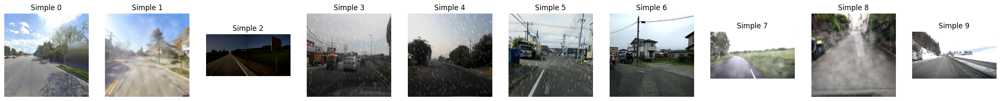

 53% 3999/7500 [10:07<07:33,  7.71it/s]

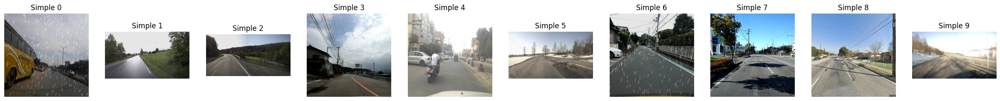

 67% 4999/7500 [12:02<04:12,  9.91it/s]

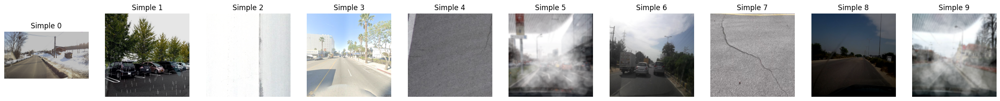

 80% 5999/7500 [14:35<04:35,  5.45it/s]

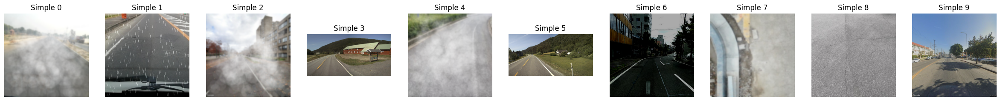

 93% 6998/7500 [16:59<01:01,  8.18it/s]

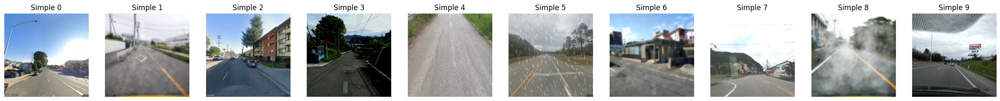

100% 7500/7500 [18:15<00:00,  6.84it/s]


Applying composite crack overlays to 7500 images...


 13% 993/7500 [01:11<06:17, 17.22it/s]  

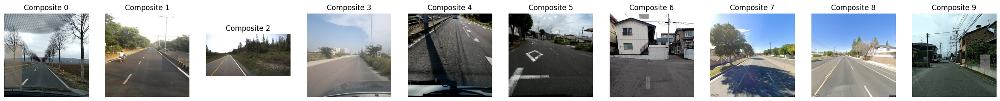

 27% 1997/7500 [02:03<04:59, 18.35it/s]

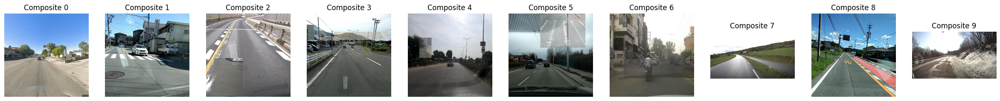

 40% 2996/7500 [02:56<03:43, 20.18it/s]

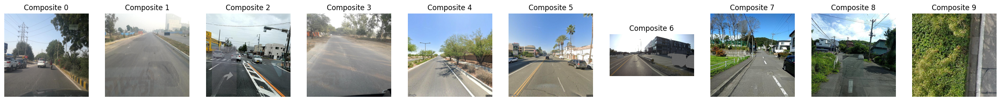

 53% 3998/7500 [03:52<02:42, 21.56it/s]

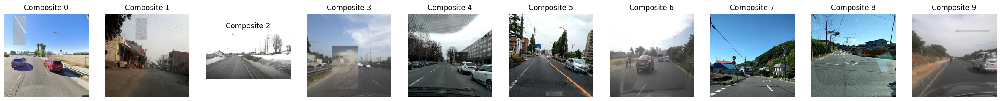

 67% 4996/7500 [04:42<01:29, 27.93it/s]

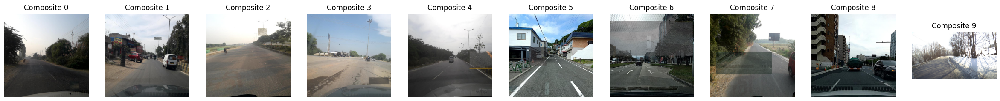

 80% 5998/7500 [05:31<00:58, 25.60it/s]

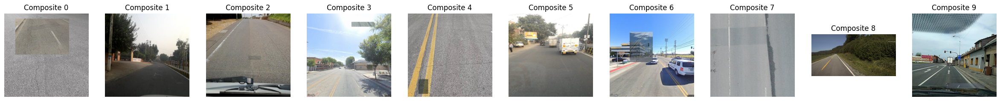

 93% 6993/7500 [06:25<00:35, 14.20it/s]

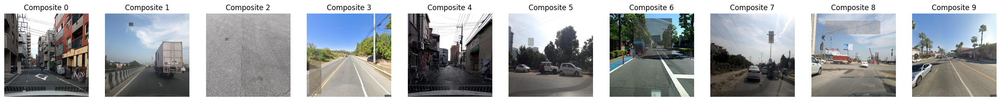

100% 7500/7500 [06:52<00:00, 18.16it/s]

✅ Batch augmentation completed with previews and saving!


In [38]:
batch_augment_pipeline(
    train_img_dir="datasets/yolo_dataset/train/images",
    train_ann_dir="datasets/yolo_dataset/train/annotations",
    save_dir="datasets/yolo_dataset/train",
    num_simple=7500,
    num_composite=7500,
    alpha=0.60,
)
